# Satellite images segmentation

The task consists of creating a neural model able to perform semantic segmentation on satellite images into six (seven with the no information) different classes. The data used in this project is extracted from the [IGN](https://geoservices.ign.fr/telechargement) archives, and can be downloaded [here](https://drive.google.com/file/d/1y73mUPzS5Hhq1RjPXc9bxch-Nv6HlJem/view?usp=sharing).

Each tile in the dataset has a 1000x1000 resolution representing a 500m x 500m footprint (the resolution is 50cm per pixel).

The file structure of the dataset is as follows:
```none
├── ign
│   ├── annotations
│   │   ├── training
│   │   │   ├── aaa.png
│   │   │   ├── bbb.png
│   │   ├── validation
│   │   │   ├── xxx.png
│   │   │   ├── yyy.png
│   ├── images
│   │   ├── training
│   │   │   ├── aaa.png
│   │   │   ├── bbb.png
│   │   ├── validation
│   │   │   ├── xxx.png
│   │   │   ├── yyy.png

```

Here is an example of the image/mask contained in the dataset: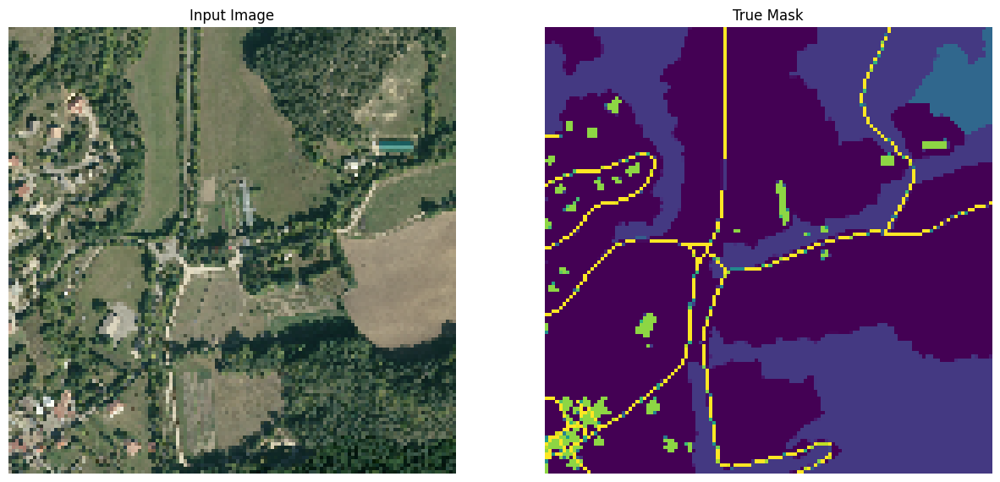

HINT: If the data does not fit into the memory, try by patching the image into smaller portions.

## Downloading the data

The data can be either downloaded from the link above and uploaded directly on Colab, or by running the following code snippet, that automatically downloads the data and unzip it.

In [2]:
!gdown 1Mm66TdaHXicjzEsSXOMEr-i42Q2M5QZl
!unzip -q ign_dataset.zip
!rm ign_dataset.zip

Downloading...
From (original): https://drive.google.com/uc?id=1Mm66TdaHXicjzEsSXOMEr-i42Q2M5QZl
From (redirected): https://drive.google.com/uc?id=1Mm66TdaHXicjzEsSXOMEr-i42Q2M5QZl&confirm=t&uuid=b0018be4-cdf1-4e2f-b879-68fc2f0257f1
To: /content/ign_dataset.zip
100% 1.58G/1.58G [00:46<00:00, 33.6MB/s]
replace ign/annotations/training/c0_0915_6395.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


## Multi-class segmentation

In this project, the input-target pair is composed by a $1000 \times 1000$ RGB image as visualized above, together with a $1000 \times 1000$ mask, that classifies each pixel by assigning to it a real number.

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf
import keras
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, Callback, LearningRateScheduler
from keras.optimizers import AdamW
import os
import glob

X_path = './ign/images/'
Y_path = './ign/annotations/'

train_name = sorted(os.listdir(os.path.join(X_path, 'training')))
test_name = sorted(os.listdir(os.path.join(X_path, 'validation')))

# As an example: load a sample to check the data
x_sample = plt.imread(os.path.join(X_path, 'training', train_name[1]))
y_sample = plt.imread(os.path.join(Y_path, 'training', train_name[1]))

print(f"Shape of x: {x_sample.shape}. Shape of y: {y_sample.shape}.")
print(f"Unique values of y: {np.unique(y_sample)}.")

Shape of x: (1000, 1000, 3). Shape of y: (1000, 1000).
Unique values of y: [0.         0.00392157 0.00784314 0.01568628 0.02352941].


In the example above, $\texttt{y_sample}$ contains 3 classes, represented by the three unique real numbers $[0, 0.00392157, 0.02352941]$.

Note that this approach is unusual in multiclass segmentation, where usually the mask is reshaped to be an $height \times width \times num. class$ binary array, where the pixel in position $(i, j)$ is classified as the class associated to the value 1, among the channels.

In this project, we assume that your data is processed as described above, since the metric used for the evaluation is implemented this way.  

## Metrics
The comparison metric for this project is the Dice Cofficient for multi-class segmentation (see the Lab about Segmentation for more informations). To apply this function, you are required to reshape both the predicted mask and the true mask to shape $\texttt{(batch_size, h, w, num_classes)}$, where $\texttt{num_classes}$ is the number of segmentation classes.

**IMPORTANT**: Remember to leave a print of average Dice Coefficient among the test set on the Notebook for a comparison. To do that, just measure the Dice Coffient by using the functions below for each batch, and take the average.

In [4]:
import numpy as np
import matplotlib.pyplot as plt

def dice_coef(y_true, y_pred):
    y_true_f = y_true.flatten()
    y_pred_f = y_pred.flatten()
    intersection = np.sum(y_true_f * y_pred_f)
    smooth = 1e-4
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def dice_coef_multilabel(y_true, y_pred, numLabels):
    dice=0
    for index in range(numLabels):
        dice += dice_coef(y_true[:,:,:,index], y_pred[:,:,:,index])
    return dice/numLabels

## Project implementation

## Data loading

### Constants
The height and the width for the input images for the network will be 256x256. This will imply to take 16 patches to cover a full image of the given dataset.
The validation dataset will be 10% of the size of the augmented train dataset.
During the testing also patches of 512x512 were tried but I achieved better results with 256x256.

In [5]:
# Height and width for the patches
HEIGHT = 256
WIDTH = 256
NUM_CLASSES = 7
BATCH_SIZE = 32
VALIDATION_BATCHES = int(0.10 * len(train_name) * 16 * 3 / BATCH_SIZE)

### Computing weights for imabalanced classes
Since some classes are heavily imbalanced (i.e. class 5 appear 9x10^5 times and class 1 appear 3x10^8 times) it has been computed an ad-hoc weight for them to use in the computation of the loss.

In [6]:
classes_count = [0, 0, 0, 0, 0, 0, 0]
for name in train_name:
  img = Image.open(os.path.join(Y_path, 'training', name))
  classes, counts = np.unique(img, return_counts=True)
  for i in range(len(classes)):
    classes_count[classes[i]] += counts[i]
classes_count = np.array(classes_count)

In [7]:
print(classes_count)

[ 68597879 368973792  69776006  41415145  41344610    918376   8974192]


I assign weights inversely proportional to class frequencies and then apply a logarithmic transformation to moderate the effect of extremely imbalanced classes. Below I can see that class 1 will be weighted 1 and class 5 will be weighted 5 times class 1.

In [8]:
def compute_class_weights(classes_count, num_classes):
    import math
    k=0.5
    total=np.sum(classes_count)
    classes_count=[math.log(k*total/float(classes_count[i])) for i in range(num_classes)]
    classes_count=[c if c>1.0 else 1.0 for c in classes_count]
    weights_dict = {cls: weight for cls, weight in enumerate(classes_count)}

    return weights_dict
class_weights = compute_class_weights(classes_count, NUM_CLASSES)
print(class_weights)

{0: 1.475520858769691, 1: 1.0, 2: 1.4584922775663423, 3: 1.9801358394651751, 4: 1.9818404123479414, 5: 5.788930860818675, 6: 3.509429572189762}


### Creation of Tensorflow Dataset

The dataset contains pretty big images and I also decide to do data augmentation, to enlarge the number of samples. This resulted in a large dataset impossible to mantain all in RAM, so it was necessary to use the Tensorflow API for Datasets.

First of all in the function *load_dataset()* I read all the images and masks that will mantained in RAM and read only once.
Then at runtime batches of the dataset will be returned from the generator *dataset_generator()*. It will take the 16 patches of 256x256 pixels and for each of them I will consider an horizontal flip, a vertical flip and the original image, resulting in a dataset that will triple in the number of samples. Of course this will be done only for the training set.

In [6]:
# Function to get 4 square images from the originale image
def get_4_patches(img, new_dim):
    original_dim = img.shape[0]
    return [img[:new_dim, :new_dim],
            img[:new_dim, (original_dim-new_dim):],
            img[(original_dim-new_dim):, :new_dim],
            img[(original_dim-new_dim):, (original_dim-new_dim):]]

# Augmentation function
def augment(image, mask):
    images = []
    masks = []

    mask = tf.expand_dims(mask, axis=-1)
    images.append(tf.image.flip_left_right(image))
    masks.append(tf.squeeze(tf.image.flip_left_right(mask)))
    images.append(tf.image.flip_up_down(image))
    masks.append(tf.squeeze(tf.image.flip_up_down(mask)))
    images.append(image)
    masks.append(tf.squeeze(mask))

    return images, masks

# Function to read and process image and mask
def process_image(img_path, mask_path):
    img = Image.open(img_path)
    img = np.array(img)
    patches_512 = get_4_patches(img, WIDTH*2)
    patches_256 = []
    for p in patches_512:
      patches_256.extend(get_4_patches(p, WIDTH))

    mask = Image.open(mask_path)
    mask = np.array(mask)
    mask_512 = get_4_patches(mask, WIDTH*2)
    mask_256 = []
    for p in mask_512:
      mask_256.extend(get_4_patches(p, WIDTH))

    processed_patches = []
    for img_patch, mask_patch in zip(patches_256, mask_256):
        img_patch = tf.convert_to_tensor(img_patch, dtype=tf.uint8)
        mask_patch = tf.convert_to_tensor(mask_patch, dtype=tf.uint8)
        processed_patches.append((img_patch, mask_patch))

    return processed_patches

# Function to load dataset into memory
def load_dataset(image_names, mask_names, X_path, Y_path, training=True):
    images = []
    masks = []

    for img_name, mask_name in zip(image_names, mask_names):
        img_path = os.path.join(X_path, 'training' if training else 'validation', img_name)
        mask_path = os.path.join(Y_path, 'training' if training else 'validation', mask_name)
        processed_patches = process_image(img_path, mask_path)
        for img_patch, mask_patch in processed_patches:
            images.append(img_patch)
            masks.append(mask_patch)

    return images, masks

# Generator function to yield augmented images(only for training dataset) and masks
def dataset_generator(images, masks, augment_data=False):
    for img_patch, mask_patch in zip(images, masks):
        if augment_data:
            aug_images, aug_masks = augment(img_patch, mask_patch)
            for aug_img, aug_mask in zip(aug_images, aug_masks):
                yield aug_img, aug_mask
        else:
            yield img_patch, mask_patch

# Function to create TensorFlow dataset
def create_dataset(image_names, mask_names, X_path, Y_path, training=True, batch_size=16):
    images=None
    masks=None
    images, masks = load_dataset(image_names, mask_names, X_path, Y_path, training)
    dataset = tf.data.Dataset.from_generator(
        lambda: dataset_generator(images, masks, augment_data=training),
        output_signature=(
            tf.TensorSpec(shape=(WIDTH, HEIGHT, 3), dtype=tf.uint8),
            tf.TensorSpec(shape=(WIDTH, HEIGHT), dtype=tf.uint8)
        )
    )

    if training:
        dataset = dataset.shuffle(buffer_size=1000)
    dataset = dataset.batch(batch_size)

    return dataset


#### Splitting in train and validation

In [9]:
train_dataset = create_dataset(train_name, train_name, X_path, Y_path, training=True, batch_size=BATCH_SIZE)
validation_dataset = train_dataset.take(VALIDATION_BATCHES)
train_dataset = train_dataset.skip(VALIDATION_BATCHES)

## Model

The used model is a variation of a classical U-net inspired from Resnet and from the articles https://arxiv.org/pdf/2103.03759 and https://arxiv.org/pdf/2211.12979 where the downsampling part is constitued of a Resnet-34 Encoder. It has been modified decreasing the number of filters to respect the constraint of the maximum number of parameters to be less than 10M.

In [7]:
from keras.models import Model
from keras.layers import Input, Conv2D, UpSampling2D, Concatenate, BatchNormalization, Add, ReLU

# Residual block:
#  (3x3Conv -> BN -> ReLU) ->
#  (3x3Conv -> BN -> + Identity -> ReLU)
def resblock(inputs, filters, kernel_size=(3, 3), padding='same', block_name=""):
    fx = Conv2D(filters, kernel_size, padding=padding, name=f'{block_name}_Conv1')(inputs)
    fx = BatchNormalization(name=f'{block_name}_BN1')(fx)
    fx = ReLU()(fx)
    fx = Conv2D(filters, kernel_size, padding=padding, name=f'{block_name}_Conv2')(fx)
    fx = BatchNormalization(name=f'{block_name}_BN2')(fx)

    out = Add()([inputs,fx])
    out = ReLU()(out)
    layer_names = [f'{block_name}_Conv1',f'{block_name}_Conv2',f'{block_name}_BN1',f'{block_name}_BN2']
    return out, layer_names

# Residual block for the downsampling where the residual connection is 1x1 Conv with stride 2 to match shapes:
#  (3x3Conv/2 -> BN -> ReLU) ->
#  (3x3Conv -> BN -> + Identity -> ReLU)
def resblock_down(inputs, filters, kernel_size=(3, 3), padding='same', block_name=""):
    fx = Conv2D(filters, kernel_size, strides=2, padding=padding, name=f'{block_name}_Conv1')(inputs)
    fx = BatchNormalization(name=f'{block_name}_BN1')(fx)
    fx = ReLU()(fx)
    fx = Conv2D(filters, kernel_size, padding=padding, name=f'{block_name}_Conv2')(fx)
    fx = BatchNormalization(name=f'{block_name}_BN2')(fx)

    conn = Conv2D(filters, 1, strides=2, padding=padding, name=f'{block_name}_ResConv')(inputs)
    conn = BatchNormalization(name=f'{block_name}_BNRes')(conn)

    out = Add()([conn,fx])
    out = ReLU()(out)
    layer_names = [f'{block_name}_Conv1',f'{block_name}_Conv2',f'{block_name}_BN1',f'{block_name}_BN2', f'{block_name}_ResConv', f'{block_name}_BNRes']
    return out, layer_names

# Downsampling block:
# (n Residual block) ->
# (1 Downsampling Residual Block)
def down_block(inputs, filters, kernel_size=(3, 3), padding='same', block_number=1, block_name=""):
    conv = inputs
    layer_names = []
    for i in range(block_number):
      conv, names = resblock(conv, filters, kernel_size, padding, block_name=f'{block_name}_{i+1}_')
      layer_names.extend(names)
    downsampled, names = resblock_down(conv, 2*filters, kernel_size, padding, block_name=f'{block_name}_down_')
    layer_names.extend(names)
    return conv, downsampled, layer_names

# Upsampling block:
# (Bilinear Upsampling) ->
# (3x3Conv -> BN -> ReLU)x2
def up_block(inputs, skip, filters, kernel_size=(3, 3), padding='same', activation='relu', block_name=""):
    up = UpSampling2D(size=(2, 2), interpolation='bilinear')(inputs)
    if skip is not None:
      concat = Concatenate()([up, skip])
    else:
      concat = up

    conv = Conv2D(filters, kernel_size, padding=padding, name=f'{block_name}_Conv1')(concat)
    conv = BatchNormalization(name=f'{block_name}_BN1')(conv)
    conv = ReLU()(conv)
    conv = Conv2D(filters, kernel_size, padding=padding, name=f'{block_name}_Conv2')(conv)
    conv = BatchNormalization(name=f'{block_name}_BN2')(conv)
    conv = ReLU()(conv)

    layer_names=[f'{block_name}_Conv1',f'{block_name}_Conv2',f'{block_name}_BN1',f'{block_name}_BN2']
    return conv, layer_names


def unet(img_size=(256, 256, 1), num_classes=1):
    not_trainable_layers = []

    # Input
    inputs = Input(shape=img_size + (3,))

    #Down Blocks
    conv1 = Conv2D(32, 7, padding='same', strides=2, name='D_128_Conv2')(inputs)  #128x128
    conv1 = BatchNormalization(name='D_128_BN')(conv1)
    conv1 = ReLU()(conv1)
    not_trainable_layers.extend(['D_128_BN','D_128_Conv2' ])
    conv2, layer_names = resblock_down(inputs=conv1, filters=32, block_name='D_64') #64x64
    not_trainable_layers.extend(layer_names)
    conv3, downsampled3, layer_names = down_block(inputs=conv2, filters=32, block_number=2, block_name='D_32') #32x32
    not_trainable_layers.extend(layer_names)
    conv4, downsampled4, layer_names = down_block(inputs=downsampled3, filters=64, block_number=3, block_name='D_16')  #16x16
    not_trainable_layers.extend(layer_names)
    conv5, downsampled5, layer_names = down_block(inputs=downsampled4, filters=128, block_number=5, block_name='D_8') #8x8
    not_trainable_layers.extend(layer_names)

    # Bottleneck
    conv6, layer_names = resblock(downsampled5, 256, 3, 'same', block_name='BOT_1')#8x8
    conv6, layer_names = resblock(conv6, 256, 3, 'same', block_name='BOT_2')#8x8
    conv6, layer_names = resblock(conv6, 256, 3, 'same', block_name='BOT_3')#8x8

    #Up Blocks
    conv7, layer_names = up_block(inputs=conv6, skip=conv5, filters=128, block_name='U_16') #16x16
    conv8, layer_names = up_block(inputs=conv7, skip=conv4, filters=64, block_name='U_32') #32x32
    conv9, layer_names = up_block(inputs=conv8, skip=conv3, filters=32, block_name='U_64') #64x64
    conv10, layer_names = up_block(inputs=conv9, skip=conv1, filters=16, block_name='U_128') #128x128
    conv11, layer_names = up_block(inputs=conv10, skip=None, filters=16, block_name='U_256') #256x256

    # Per-pixel classification layer
    outputs = keras.layers.Conv2D(num_classes, 1, activation="softmax", padding="same")(conv11) #256x256


    model = Model(inputs=inputs, outputs=outputs, name="unet")
    return model, not_trainable_layers


In [8]:
# Build model
model, fine_tuning_layers = unet(img_size=(HEIGHT, WIDTH),
             num_classes=NUM_CLASSES)

model.summary()

Model: "unet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_128_Conv2 (Conv2D)      │ (None, 128, 128, 32)   │          4,736 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_128_BN                  │ (None, 128, 128, 32)   │            128 │ D_128_Conv2[0][0]      │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 128, 128, 32)   │              0 │ D_128_BN[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_64_Conv1 (Conv2D)       │ (None, 64, 64, 32)     │          9,248 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_64_BN1                  │ (None, 64, 64, 32)     │            128 │ D_64_Conv1[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 64, 64, 32)     │              0 │ D_64_BN1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_64_ResConv (Conv2D)     │ (None, 64, 64, 32)     │          1,056 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_64_Conv2 (Conv2D)       │ (None, 64, 64, 32)     │          9,248 │ re_lu_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_64_BNRes                │ (None, 64, 64, 32)     │            128 │ D_64_ResConv[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_64_BN2                  │ (None, 64, 64, 32)     │            128 │ D_64_Conv2[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 64, 64, 32)     │              0 │ D_64_BNRes[0][0],      │
│                           │                        │                │ D_64_BN2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 64, 64, 32)     │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_32_1__Conv1 (Conv2D)    │ (None, 64, 64, 32)     │          9,248 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_32_1__BN1               │ (None, 64, 64, 32)     │            128 │ D_32_1__Conv1[0][0]    │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 64, 64, 32)     │              0 │ D_32_1__BN1[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ D_32_1__Conv2 (Conv2D

 Total params: 7,316,887 (27.91 MB)

 Trainable params: 7,306,263 (27.87 MB)

 Non-trainable params: 10,624 (41.50 KB)

## Training

The training was split in 2 part. In the first part were done 15 epochs with a learning rate that has been divided by 10 every 5 epochs. In the fine-tuning part I locked the contracting part and done 10 more epochs of training.

To weight in a different manner less frequent classes it was necessary to define a custom loss function based on the sparse categorical cross entropy, where each unweighted loss is been multiplied with the previously computed weights.

In [12]:
class_weights_tensor = tf.constant([class_weights[i] for i in range(len(class_weights))], dtype=tf.float32)

# Define custom loss function with weighted classes
def weighted_sparse_categorical_crossentropy(y_true, y_pred):
    y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(class_weights))
    # Compute the weights for each pixel
    weights = tf.reduce_sum(class_weights_tensor * y_true_one_hot, axis=-1)
    # Compute the unweighted loss
    unweighted_loss = tf.keras.losses.sparse_categorical_crossentropy(y_true, y_pred)
    # Compute the weighted loss
    weighted_loss = unweighted_loss * weights
    return tf.reduce_mean(weighted_loss)

In [ ]:
model_checkpoint = ModelCheckpoint("./weights.{epoch:02d}-{val_loss:.2f}.h5", monitor='val_loss', verbose=1, save_weights_only=True)

def step_decay(lr0, s):
  def step_decay_fn(epoch):
    if epoch%s == 0: return lr0*(0.1**(epoch/s))
    else: return lr0*(0.1**np.floor(epoch/s))
  return step_decay_fn
step_decay_fn = step_decay(1e-3, 5)

lr_scheduler = LearningRateScheduler(
    step_decay_fn,
    verbose=1
)
callbacks = [model_checkpoint, lr_scheduler]

In [ ]:
# Training Config
N_EPOCHS = 15

# Compile model
model.compile(
    optimizer=AdamW(weight_decay=0.005),
    loss=weighted_sparse_categorical_crossentropy,
    metrics=["accuracy"]
)
# Train the model, doing validation at the end of each epoch.
history = model.fit(train_dataset,
              epochs=N_EPOCHS,
              callbacks=callbacks,
              validation_data=validation_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/15
    810/Unknown - 282s 288ms/step - loss: 1.2785 - accuracy: 0.7168
Epoch 1: saving model to ./weights.01-1.61.h5
810/810 [==============================] - 295s 304ms/step - loss: 1.2785 - accuracy: 0.7168 - val_loss: 1.6092 - val_accuracy: 0.6770 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/15
810/810 [==============================] - ETA: 0s - loss: 1.1054 - accuracy: 0.7539
Epoch 2: saving model to ./weights.02-2.38.h5
810/810 [==============================] - 248s 300ms/step - loss: 1.1054 - accuracy: 0.7539 - val_loss: 2.3782 - val_accuracy: 0.3771 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/15
810/810 [==============================] - ETA: 0s - loss: 1.0348 - accuracy: 0.7721
Epoch 3: saving model to ./weights.03-1.62.h5
810/810 [==============================] - 246s 300ms/step - loss: 1.0348 - accuracy: 0.7721 - val_loss

### Fine Tuning

After the training phase I loaded the weights obtained in epooch 14(the one with the lowest validaiton loss) and locked the contracting layers:

In [ ]:
model.load_weights('weights.14-0.92.h5')
for l in fine_tuning_layers:
  model.get_layer(l).trainable=False
model.summary()

Model: "unet"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 D_128_Conv/2 (Conv2D)       (None, 128, 128, 32)         4736      ['input_1[0][0]']             
                                                                                                  
 D_128_BN (BatchNormalizati  (None, 128, 128, 32)         128       ['D_128_Conv/2[0][0]']        
 on)                                                                                              
                                                                                                  
 re_lu (ReLU)                (None, 128, 128, 32)         0         ['D_128_BN[0][0]']         

We can clearly see that the number of parameters to train is decreased by a lot.
During the fine-tuning parts, different strategies were tried. I tried also to lock the weights of the expanding part, lock the weights of the bottleneck, tried different learning rate and number of epochs.
The following is the configuration that has taken the lowest validation loss and the better final results.

In [ ]:
# Training Config
N_EPOCHS = 10

step_decay_fn = step_decay(1e-3, 5)
lr_scheduler = LearningRateScheduler(
    step_decay_fn,
    verbose=1
)
callbacks = [model_checkpoint, lr_scheduler]

# Compile model
model.compile(
    optimizer=AdamW(weight_decay=0.005),
    loss=weighted_sparse_categorical_crossentropy,
    metrics=["accuracy"]
)

# Train the model, doing validation at the end of each epoch.
history = model.fit(train_dataset,
              epochs=N_EPOCHS,
              callbacks=callbacks,
              validation_data=validation_dataset)


Epoch 1: LearningRateScheduler setting learning rate to 0.001.
Epoch 1/10
    810/Unknown - 207s 223ms/step - loss: 0.8577 - accuracy: 0.8122
Epoch 1: saving model to ./weights.01-0.98.h5
810/810 [==============================] - 219s 238ms/step - loss: 0.8577 - accuracy: 0.8122 - val_loss: 0.9764 - val_accuracy: 0.8036 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.001.
Epoch 2/10
810/810 [==============================] - ETA: 0s - loss: 0.8368 - accuracy: 0.8176
Epoch 2: saving model to ./weights.02-0.99.h5
810/810 [==============================] - 194s 234ms/step - loss: 0.8368 - accuracy: 0.8176 - val_loss: 0.9923 - val_accuracy: 0.8011 - lr: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.001.
Epoch 3/10
810/810 [==============================] - ETA: 0s - loss: 0.8247 - accuracy: 0.8195
Epoch 3: saving model to ./weights.03-0.95.h5
810/810 [==============================] - 193s 234ms/step - loss: 0.8247 - accuracy: 0.8195 - val_loss

## Evaluation


In the evaluation part first of all I read the test set and then check the behavior of loss and accuracy both for the first training phase and for the fine-tuning phase.

In [12]:
test_dataset = create_dataset(test_name, test_name, X_path, Y_path, training=False, batch_size=BATCH_SIZE)

In [ ]:
def plot_metrics(history):
    loss_history = history.history['loss']
    val_loss_history = history.history['val_loss']
    acc_history = history.history['accuracy']
    val_acc_history = history.history['val_accuracy']

    plt.figure(figsize=(12, 5))

    # Plot Loss
    plt.subplot(1, 2, 1)
    plt.plot(loss_history)
    plt.plot(val_loss_history)
    plt.grid()
    plt.xlabel('Epoch')
    plt.legend(['Loss', 'Val Loss'])
    plt.title('Loss')

    # Plot Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(acc_history)
    plt.plot(val_acc_history)
    plt.grid()
    plt.xlabel('Epoch')
    plt.legend(['Accuracy', 'Val Accuracy'])
    plt.title('Accuracy')

    plt.tight_layout()
    plt.show()

First training phase:

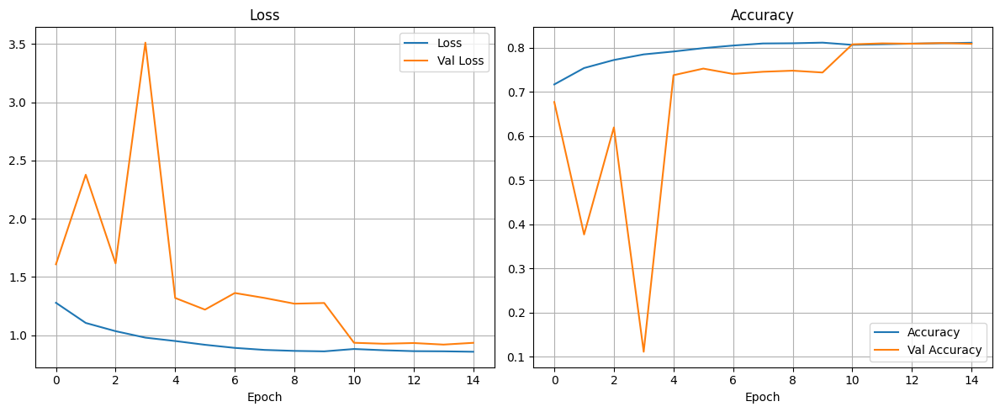

In [ ]:
plot_metrics(history)

Fine-Tuning phase:

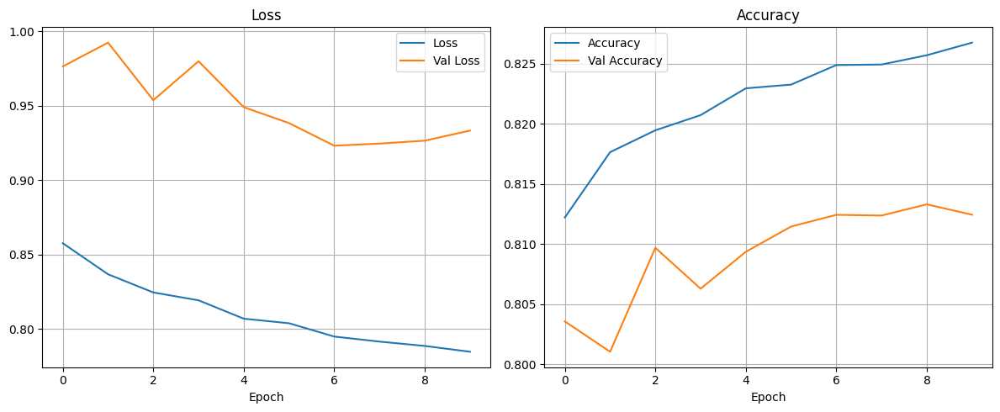

In [ ]:
plot_metrics(history)

Now I pass to the evaluation of the developed model.

In [9]:
def evaluate(test_dataset, model, batch_size, num_classes):
    metric = 0.0
    num_images = 0
    num_batches = 0

    for images, masks in test_dataset:
        pred_masks = model.predict(images, verbose=0)
        one_hot_encoded_pred = np.eye(num_classes)[tf.argmax(pred_masks, axis=-1).numpy()]
        one_hot_encoded_true = np.eye(num_classes)[masks.numpy()]
        batch_dice = 0
        num_batches += 1
        for i in range(batch_size):
            batch_dice += dice_coef_multilabel(np.expand_dims(one_hot_encoded_true[i,:,:,:],0), np.expand_dims(one_hot_encoded_pred[i,:,:,:],0), num_classes)
            num_images += 1
        metric += batch_dice

        running_average = metric / num_images
        if num_batches%10==0:
          print(f'\rBatch {num_batches} Dice Score: {round(batch_dice/batch_size, 2)}, Running Average Dice Score: {round(running_average, 2)}')


    average_metric = metric / num_images
    print('\nAverage Dice Score:', average_metric)
    return

First of all I compute the dice coefficient for the weights obtained in the first part of the training without locking any layer.

In [ ]:
model.load_weights('weights.14-0.92.h5')
evaluate(test_dataset, model,BATCH_SIZE, NUM_CLASSES)

Batch 10 Dice Score: 0.6, Running Average Dice Score: 0.68
Batch 20 Dice Score: 0.76, Running Average Dice Score: 0.66
Batch 30 Dice Score: 0.7, Running Average Dice Score: 0.69
Batch 40 Dice Score: 0.79, Running Average Dice Score: 0.69
Batch 50 Dice Score: 0.79, Running Average Dice Score: 0.68
Batch 60 Dice Score: 0.71, Running Average Dice Score: 0.68
Batch 70 Dice Score: 0.67, Running Average Dice Score: 0.68
Batch 80 Dice Score: 0.65, Running Average Dice Score: 0.67
Batch 90 Dice Score: 0.62, Running Average Dice Score: 0.67
Batch 100 Dice Score: 0.56, Running Average Dice Score: 0.67

Average Dice Score: 0.6680140385274054


And then we check the result loading the weights for the epoch with the best validation loss of the fine-tuning phase:

In [22]:
model.load_weights('weights.07-0.92.h5')
evaluate(test_dataset, model,BATCH_SIZE, NUM_CLASSES)

Batch 10 Dice Score: 0.63, Running Average Dice Score: 0.7
Batch 20 Dice Score: 0.76, Running Average Dice Score: 0.68
Batch 30 Dice Score: 0.71, Running Average Dice Score: 0.7
Batch 40 Dice Score: 0.8, Running Average Dice Score: 0.71
Batch 50 Dice Score: 0.82, Running Average Dice Score: 0.7
Batch 60 Dice Score: 0.73, Running Average Dice Score: 0.7
Batch 70 Dice Score: 0.69, Running Average Dice Score: 0.7
Batch 80 Dice Score: 0.67, Running Average Dice Score: 0.7
Batch 90 Dice Score: 0.67, Running Average Dice Score: 0.69
Batch 100 Dice Score: 0.55, Running Average Dice Score: 0.69

Average Dice Score: 0.6912728775251886


Some example of predicted images:

In [10]:
model.load_weights('weights.07-0.92.h5')
test_dataset = create_dataset(test_name, test_name, X_path, Y_path, training=False, batch_size=16).shuffle(buffer_size=1000)

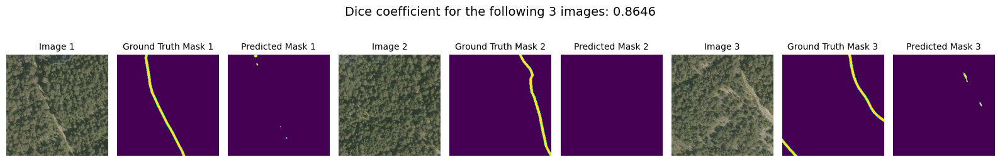

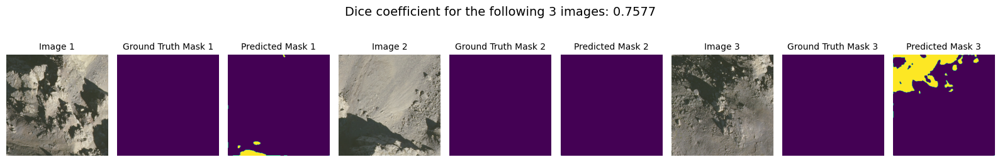

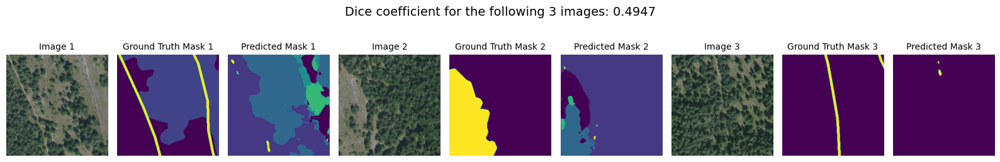

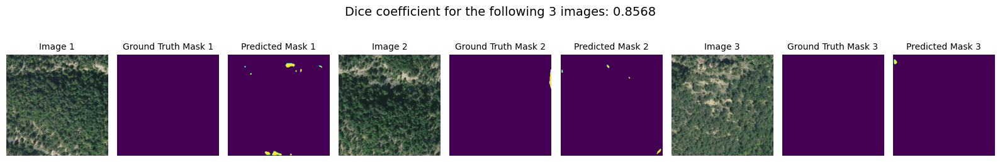

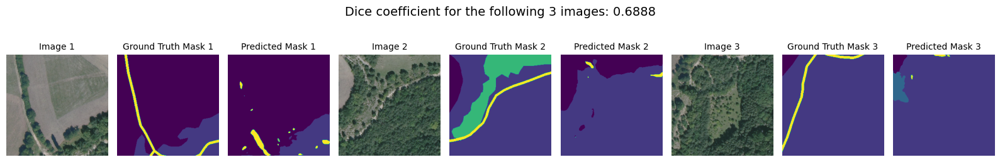

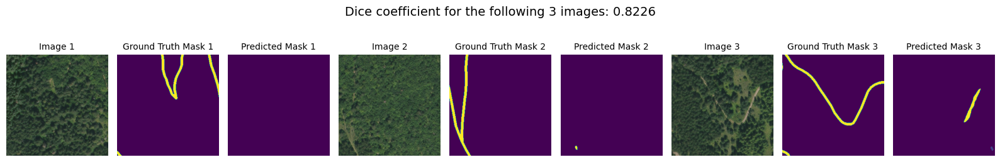

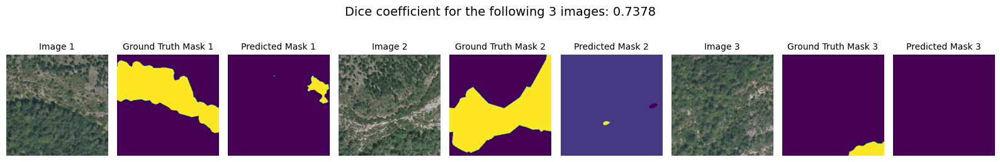

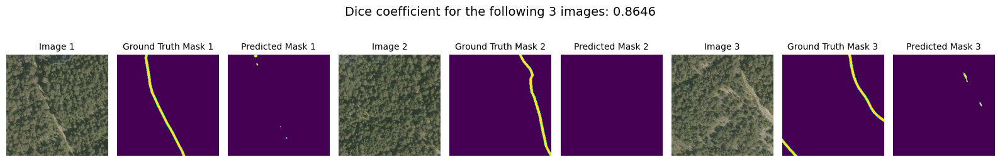

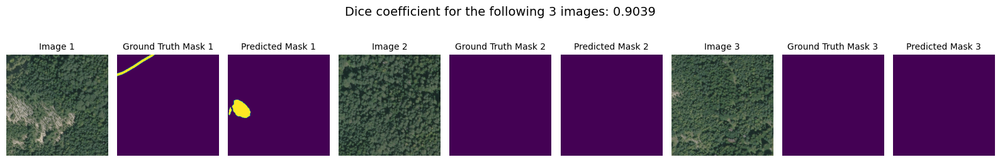

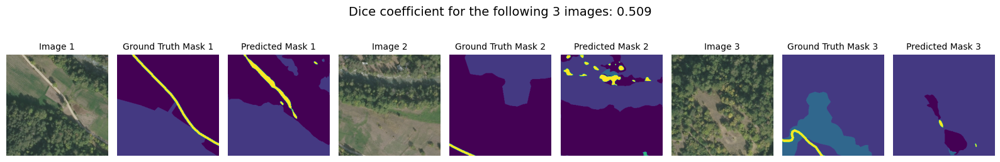

In [24]:
for k in range(10):
    for images, masks in test_dataset.shuffle(buffer_size=1000).take(1):
        images = images.numpy()[:3,:,:,:]
        masks = masks.numpy()[:3,:,:]
        pred_masks = model.predict(images, verbose=0, steps=1)
        one_hot_encoded_pred = np.eye(NUM_CLASSES)[tf.argmax(pred_masks, axis=-1).numpy()]
        pred_masks = tf.math.argmax(pred_masks, axis=-1)
        pred_masks = pred_masks[..., tf.newaxis]

        plt.figure(figsize=(16, 3))
        for i in range(3):
            plt.subplot(1, 9, i * 3 + 1)
            plt.imshow(images[i])
            plt.title(f"Image {i+1}", fontsize=10)
            plt.axis('off')

            plt.subplot(1, 9, i * 3 + 2)
            plt.imshow(masks[i])
            plt.title(f"Ground Truth Mask {i+1}", fontsize=10)
            plt.axis('off')

            plt.subplot(1, 9, i * 3 + 3)
            plt.imshow(pred_masks[i])
            plt.title(f"Predicted Mask {i+1}", fontsize=10)
            plt.axis('off')

        one_hot_encoded_true = np.eye(NUM_CLASSES)[masks]
        batch_dice = 0
        for i in range(3):
            batch_dice += dice_coef_multilabel(np.expand_dims(one_hot_encoded_true[i,:,:,:],0), np.expand_dims(one_hot_encoded_pred[i,:,:,:],0), NUM_CLASSES)

        plt.suptitle(f'Dice coefficient for the following 3 images: {round(batch_dice/3,4)}', fontsize=14, y=0.97)  # Adjust y position and fontsize
        plt.tight_layout()
        plt.show()
        plt.close()

Since the model work with 256x256 images let's reconstruct the original 1000x1000 images and check the result on the whole scene.

In [11]:
GRID_SIZE = 4  # The 4x4 grid

# The custom order for the patches
PATCH_ORDER = [
    [0, 1, 4, 5],   # First row
    [2, 3, 6, 7],   # Second row
    [8, 9, 12, 13], # Third row
    [10, 11, 14, 15] # Fourth row
]
# Reconstruct the images based on the custom patch order
def reconstruct_image(patches, patch_order, grid_size=GRID_SIZE):
    """Reconstructs a full image from patches in a custom order."""
    rows = []
    for row_patches in patch_order:
        # Get the patches in the correct order for this row
        row = np.concatenate([patches[i] for i in row_patches], axis=1)
        rows.append(row)
    # Concatenate all the rows to get the full image
    return np.concatenate(rows, axis=0)

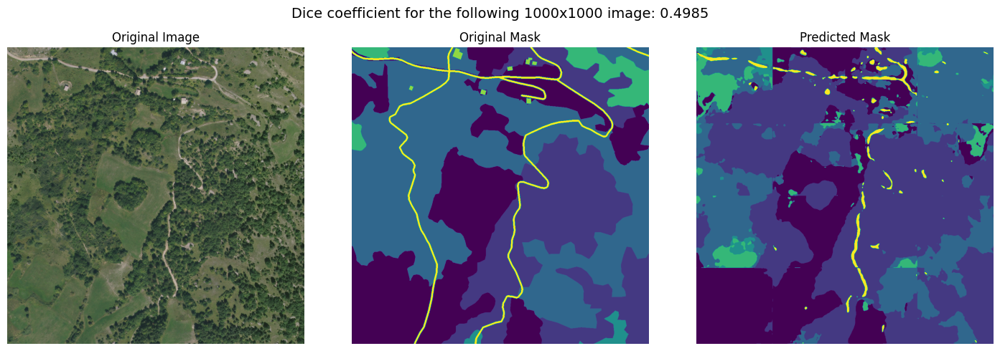

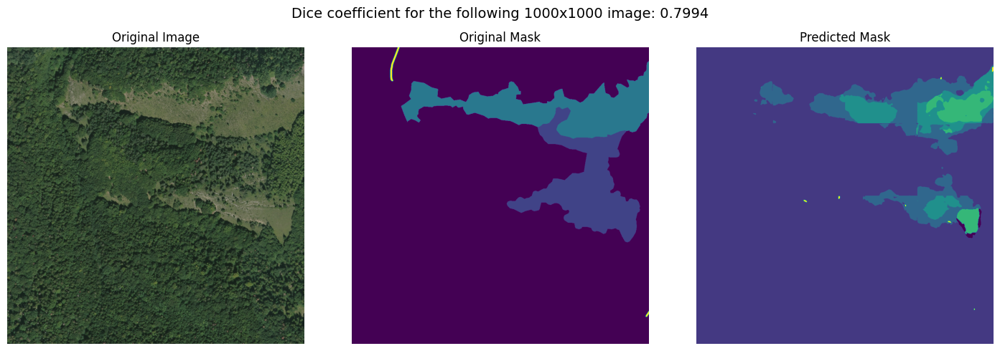

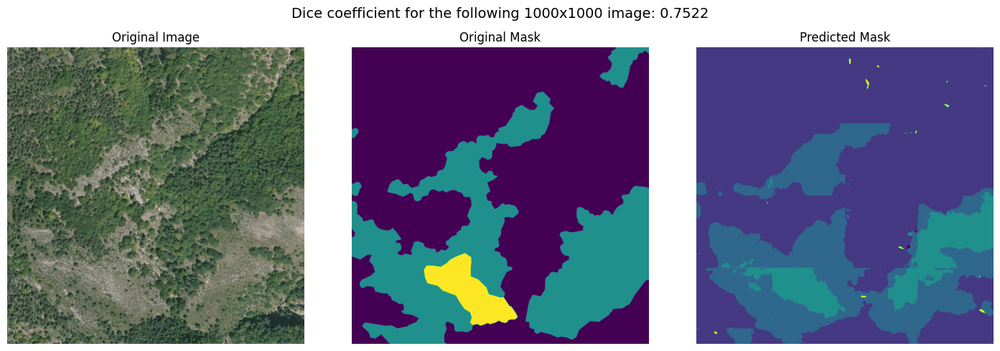

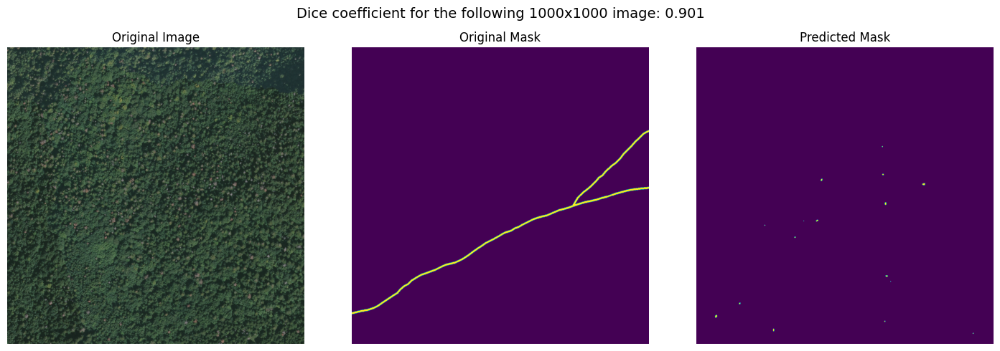

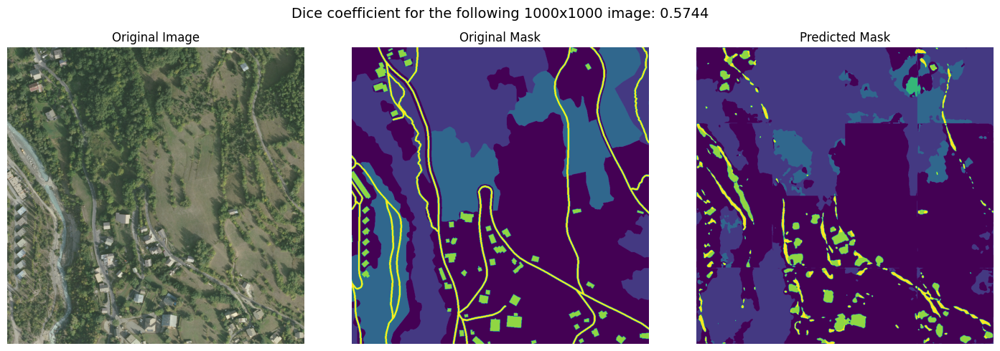

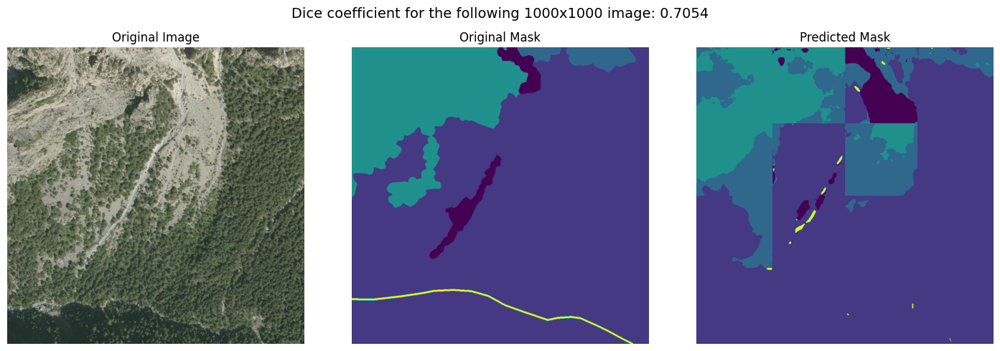

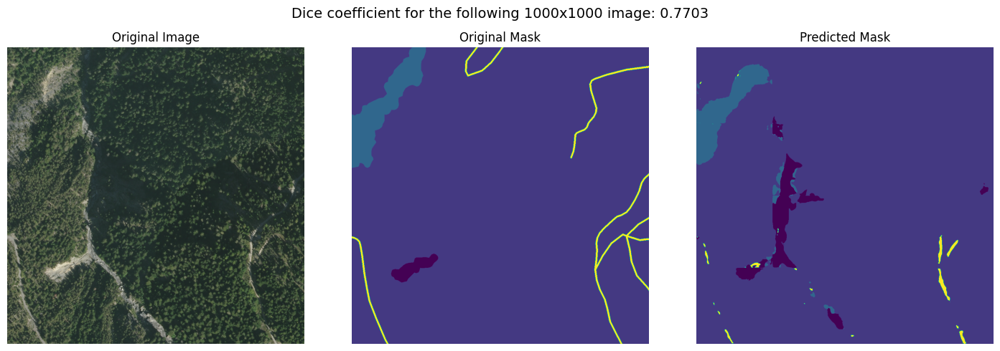

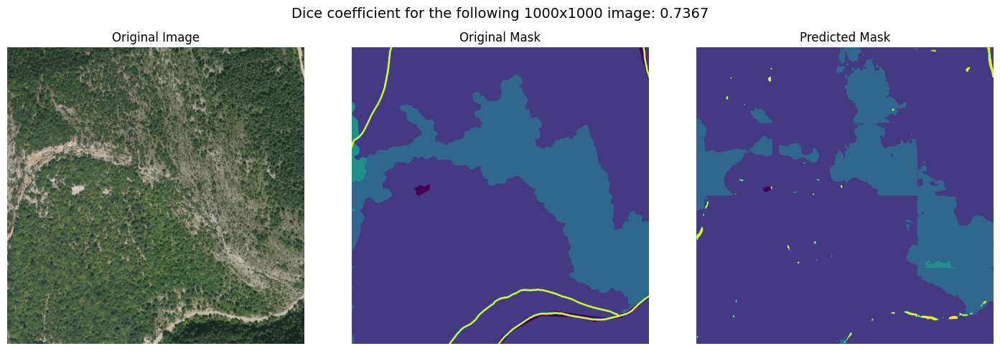

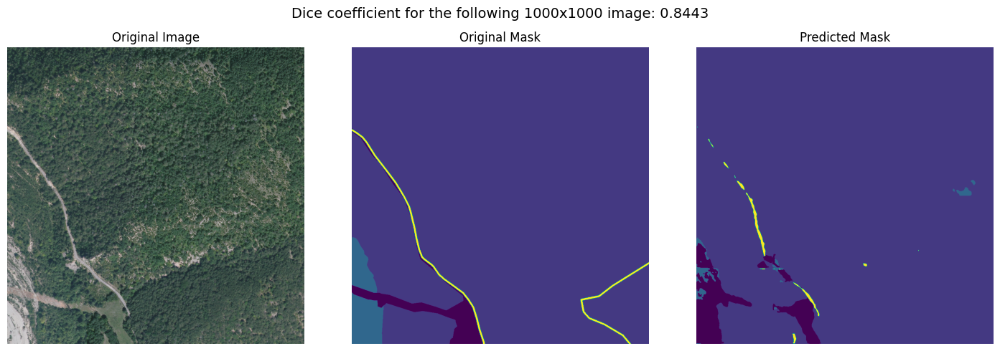

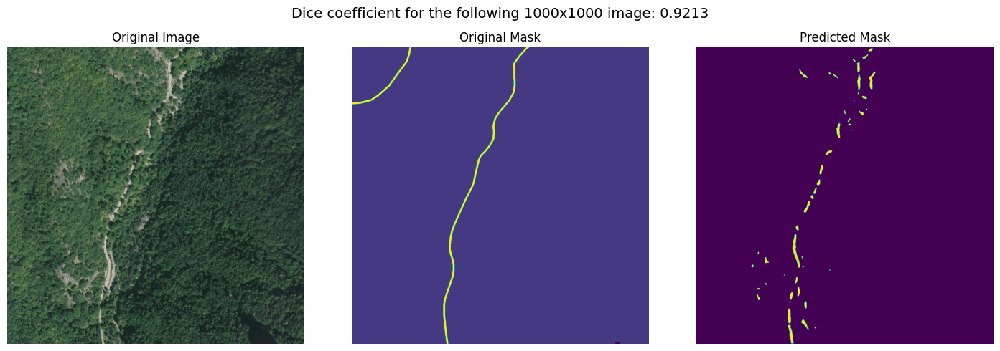

In [15]:
for k in range(10):
    for images, masks in test_dataset.take(1):
            images = images.numpy()
            masks = masks.numpy()

            # Predict masks
            pred_masks = model.predict(images, verbose=0, steps=1)
            one_hot_encoded_pred = np.eye(NUM_CLASSES)[tf.argmax(pred_masks, axis=-1).numpy()]
            pred_masks = tf.math.argmax(pred_masks, axis=-1).numpy()  # Convert to numpy for easier handling
            pred_masks = pred_masks[..., np.newaxis]  # Add channel dimension for plotting

            rows_to_remove = np.r_[0:500, 525:1024]
            cols_to_remove = np.r_[0:500, 525:1024]
            original_image = reconstruct_image(images, PATCH_ORDER)[rows_to_remove][:, cols_to_remove]
            original_mask = reconstruct_image(masks, PATCH_ORDER)[rows_to_remove][:, cols_to_remove]
            predicted_mask = reconstruct_image(pred_masks, PATCH_ORDER)[rows_to_remove][:, cols_to_remove]

            # Plot the images
            fig, ax = plt.subplots(1, 3, figsize=(15, 5))
            ax[0].imshow(original_image)
            ax[0].set_title("Original Image")
            ax[0].axis('off')
            ax[1].imshow(original_mask)
            ax[1].set_title("Original Mask")
            ax[1].axis('off')
            ax[2].imshow(predicted_mask)
            ax[2].set_title("Predicted Mask")
            ax[2].axis('off')
            one_hot_encoded_true = np.eye(NUM_CLASSES)[masks]
            batch_dice = 0
            for i in range(16):
                batch_dice += dice_coef_multilabel(np.expand_dims(one_hot_encoded_true[i,:,:,:],0), np.expand_dims(one_hot_encoded_pred[i,:,:,:],0), NUM_CLASSES)

            plt.suptitle(f'Dice coefficient for the following 1000x1000 image: {round(batch_dice/16,4)}', fontsize=14, y=0.97)  # Adjust y position and fontsize
            plt.tight_layout()
            plt.tight_layout()
            plt.show()
            break  # Exit after one batch
            plt.close()